**Predicting the Classification of Pulsar Stars**
==========

- Narrate code (during or before)
- Enumerate Table/Graphs. How to do that? What about legend?
- MAX - MIN
- Can be 2 predictors?
- Graph for visualization

# Methods & Results:


In [1]:
# Loading libraries
library(tidyverse)
library(RColorBrewer)
library(repr)
library(tidymodels)
install.packages("kknn")

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

### Pre-Analysis

In [2]:
# Reading, renaming and mutating to factor format (pulsar), tidying
star_data <- read_csv("https://raw.githubusercontent.com/luigivicencio/dsci100-003-008/main/HTRU_2.csv", col_names = FALSE) |>
    rename("mean_ip" = X1, "sd_ip" = X2, "kurtosis_ip" = X3, 
           "skew_ip" = X4, "mean_dmsnr" = X5, "sd_dmsnr" = X6, 
           "kurtosis_dmsnr" = X7, "skew_dmsnr" = X8, "pulsar" = X9)|>
    mutate(pulsar = as_factor(pulsar)) |>
    mutate(pulsar = fct_recode(pulsar,"No" = "0", "Yes" = "1"))

head(star_data)
tail(star_data)

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,No
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,No
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,No
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,No
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,No
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,No


mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
96.0000,44.19311,0.3886740,0.28134362,1.871237,15.83375,9.634927,104.821623,No
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,No
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,No
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,No
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,No
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,No


In [3]:
set.seed(1010)

#Splitting the dataset into training and testing subgroups (where 75% of the data will be used as the training set)
star_split <- initial_split(star_data, prop = 0.75, strata = pulsar)  
star_train <- training(star_split)   
star_test <- testing(star_split)

#Creating a recipe, scaling, centering, and baking
star_recipe1 <- recipe(pulsar ~ ., data = star_train) |>
    step_scale(all_predictors()) |>
    step_center(all_predictors()) |>
    prep()

scaled_star <- bake(star_recipe1, star_train)

star_table <- group_by(scaled_star, pulsar) |>
    summarize(count = n(),
             missing_values = sum(is.na(scaled_star)), # check that
             mean_mean_ip = mean(mean_ip), # check that
             mean_sd_ip = mean(sd_ip),
             mean_skew_ip = mean(skew_ip),
             mean_kurtosis_ip = mean(kurtosis_ip),
             mean_mean_dmsnr = mean(mean_dmsnr),
             mean_sd_dmsnr = mean(sd_dmsnr),
             mean_skew_dmsnr = mean(skew_dmsnr),
             mean_kurtosis_dmsnr = mean(kurtosis_dmsnr))

star_table

pulsar,count,missing_values,mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
No,12199,0,0.2124711,0.1156343,-0.2238643,-0.2497242,-0.1257689,-0.1555325,0.08199895,0.1234337
Yes,1224,0,-2.1175940,-1.1524696,2.2311439,2.4888771,1.2534763,1.5501153,-0.81724280,-1.2302023


In [4]:
### LEGEND

In [5]:
# HOW TO CALCULATE THE DIFFERENCE BETWEEN MAX AND MIN

star_table_analysis <- star_table |>
    select(mean_mean_ip:mean_kurtosis_dmsnr) |>
    map(max) |>
    as_tibble()
star_table_analysis

star_table_analysis_2 <- star_table |>
    select(mean_mean_ip:mean_kurtosis_dmsnr) |>
    map(min) |>
    as_tibble()
star_table_analysis_2

 
union(star_table_analysis, star_table_analysis_2)

setdiff(star_table_analysis, star_table_analysis_2)


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.2124711,0.1156343,2.231144,2.488877,1.253476,1.550115,0.08199895,0.1234337


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
-2.117594,-1.15247,-0.2238643,-0.2497242,-0.1257689,-0.1555325,-0.8172428,-1.230202


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.2124711,0.1156343,2.2311439,2.4888771,1.2534763,1.5501153,0.08199895,0.1234337
-2.1175940,-1.1524696,-0.2238643,-0.2497242,-0.1257689,-0.1555325,-0.81724280,-1.2302023


mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.2124711,0.1156343,2.231144,2.488877,1.253476,1.550115,0.08199895,0.1234337


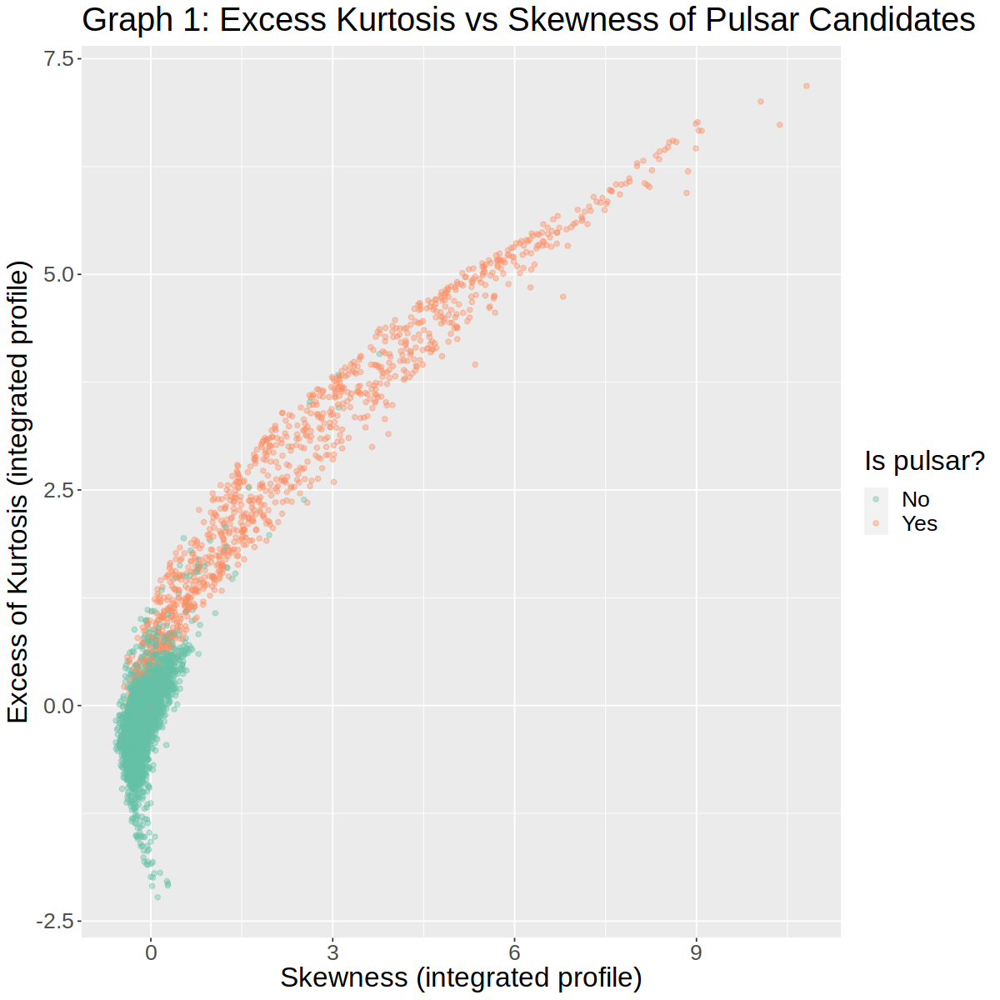

In [6]:
#Creating an initial plot to visualize the data
options(repr.plot.width = 10, repr.plot.height = 10)

star_plot_skew <- ggplot (scaled_star, aes(x = skew_ip, y = kurtosis_ip, color = pulsar)) +
                geom_point(alpha = 0.4) +
                labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
                ggtitle("Graph 1: Excess Kurtosis vs Skewness of Pulsar Candidates") +
                theme(text = element_text(size = 20)) + 
                scale_color_brewer(palette = "Set2")
star_plot_skew        

In [7]:
## LEGEND

### Data Analysis

NULL

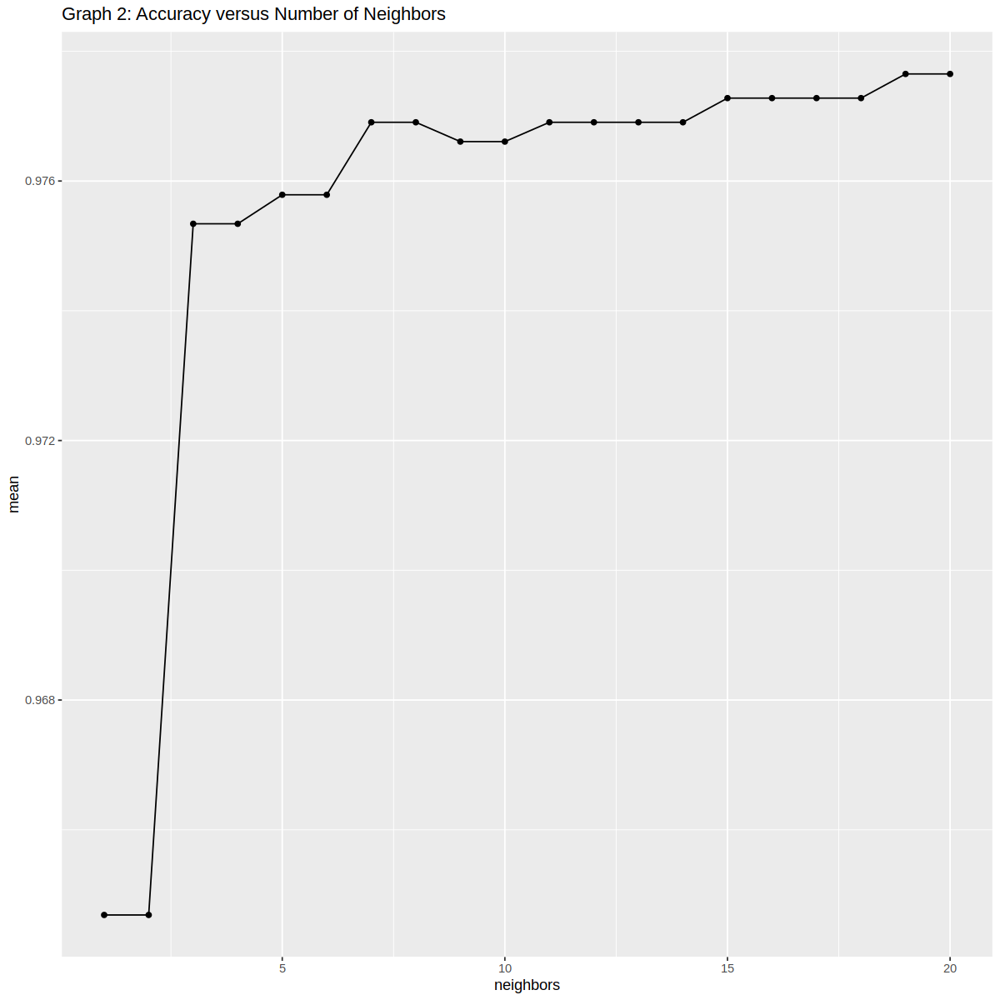

In [8]:
set.seed(1010)

# Parameter value selection
knn_tune <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
       set_engine("kknn") |>
       set_mode("classification")

star_recipe <- recipe(pulsar ~ kurtosis_ip + skew_ip, data = star_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

star_vfold <- vfold_cv(star_train, v = 5, strata = pulsar)
k_vals <- tibble(neighbors = seq(from = 1, to = 20, by = 1))

knn_results <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_tune) |>
    tune_grid(resamples = star_vfold, grid = k_vals) |>
    collect_metrics() |>
    filter(.metric == "accuracy")

accuracy_versus_k <- ggplot(knn_results, aes(x = neighbors, y = mean))+
        geom_point() +
        geom_line() +
        ggtitle("Graph 2: Accuracy versus Number of Neighbors")
        labs(x = "Neighbors", y = "Accuracy Estimate") +
        scale_x_continuous(breaks = seq(0, 20, by = 1)) + 
        scale_y_continuous(limits = c(0.8, 1.0))

accuracy_versus_k

In [9]:
## LEGEND



In [10]:
# Model
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 15) |>
       set_engine("kknn") |>
       set_mode("classification")

knn_fit <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_spec) |>
    fit(data = star_train)

# Test
star_test_predictions <- predict(knn_fit, star_test) |>
  bind_cols(star_test) |>
  metrics(truth = pulsar, estimate = .pred_class) |>
  filter(.metric == "accuracy")

star_test_predictions

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9801117


### Visualization

List of 1
 $ text:List of 11
  ..$ family       : NULL
  ..$ face         : NULL
  ..$ colour       : NULL
  ..$ size         : num 12
  ..$ hjust        : NULL
  ..$ vjust        : NULL
  ..$ angle        : NULL
  ..$ lineheight   : NULL
  ..$ margin       : NULL
  ..$ debug        : NULL
  ..$ inherit.blank: logi FALSE
  ..- attr(*, "class")= chr [1:2] "element_text" "element"
 - attr(*, "class")= chr [1:2] "theme" "gg"
 - attr(*, "complete")= logi FALSE
 - attr(*, "validate")= logi TRUE

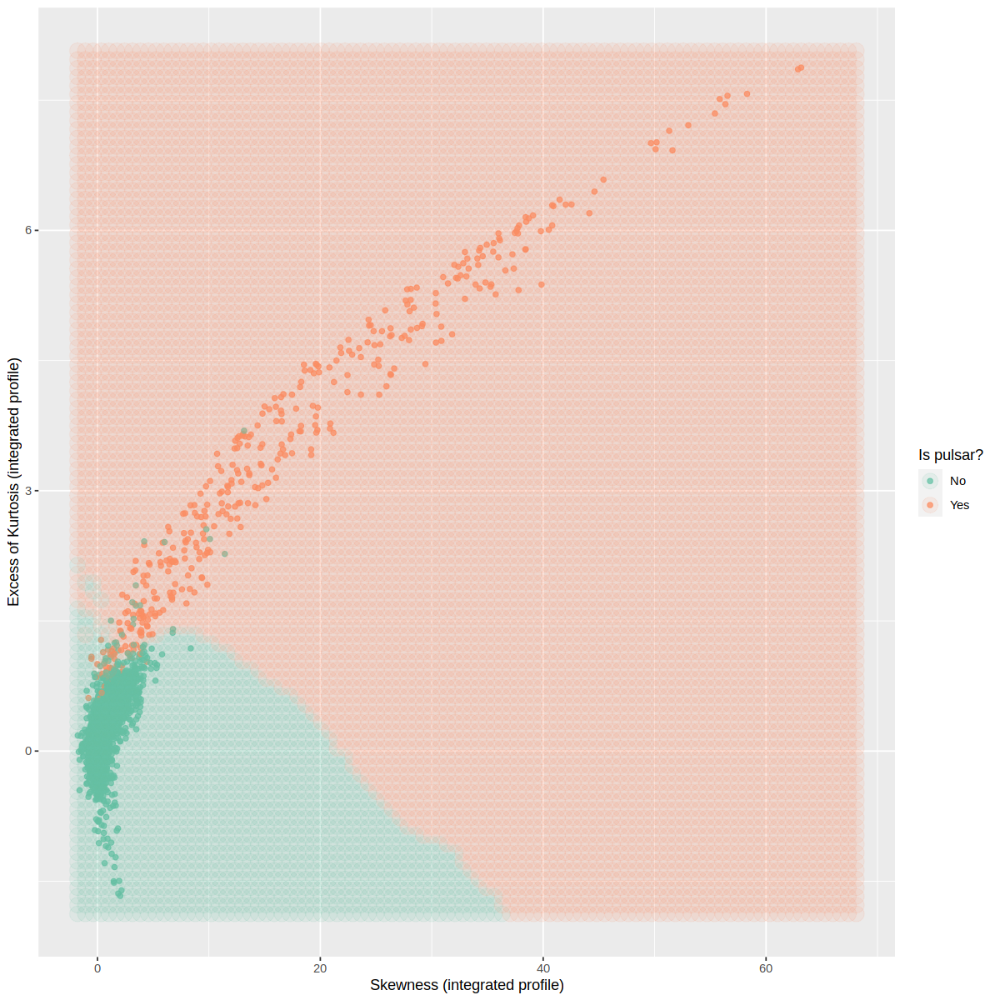

In [13]:
#### 
#GRAPH
# create the grid of area/smoothness vals, and arrange in a data frame
skew_grid <- seq(min(star_data$skew_ip), 
                max(star_data$skew_ip), 
                length.out = 100)
kurtosis_grid <- seq(min(star_data$kurtosis_ip), 
                max(star_data$kurtosis_ip), 
                length.out = 100)
asgrid <- as_tibble(expand.grid(skew_ip = skew_grid, 
                                kurtosis_ip = kurtosis_grid))

# use the fit workflow to make predictions at the grid points
knnPredGrid <- predict(knn_fit, asgrid)

# bind the predictions as a new column with the grid points
prediction_table <- bind_cols(knnPredGrid, asgrid) |> 
  rename(pulsar = .pred_class)

# plot:
# 1. the colored scatter of the original data
# 2. the faded colored scatter for the grid points
workflow_plot <-
  ggplot() +
  geom_point(data = star_test, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.75) +
  geom_point(data = prediction_table, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.1, 
             size = 5) +
  labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
  scale_color_brewer(palette = "Set2")
  theme(text = element_text(size = 12))



workflow_plot